In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Set paths for dataset
dataset_path = '/content/drive/MyDrive/dataset'
image_path = '/content/drive/MyDrive/dataset/Images'
caption_path = '/content/drive/MyDrive/dataset/captions.json'

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import os
import tensorflow as tf
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import Sequence
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Activation, Dropout, Flatten, Dense, Input, Layer
from tensorflow.keras.layers import Embedding, LSTM, add, Concatenate, Reshape, concatenate, Bidirectional
from tensorflow.keras.applications import VGG16, ResNet50, DenseNet201
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap

plt.rcParams['font.size'] = 12
sns.set_style("dark")
warnings.filterwarnings('ignore')

In [ ]:
image_path = '/content/drive/MyDrive/dataset/Images'

In [ ]:
import tensorflow as tf

# Example data setup (replace this with your actual data)
images = tf.random.normal([1000, 224, 224, 3])  # Example: 1000 images of size 224x224x3
labels = tf.random.uniform([1000], maxval=10, dtype=tf.int32)  # Example labels for 10 classes

# Define batch size
batch_size = 32

# Create a TensorFlow dataset and batch it
train_dataset = tf.data.Dataset.from_tensor_slices((images, labels)).batch(batch_size)

# Count total images in the dataset
total_images_trained = sum(batch[0].shape[0] for batch in train_dataset)
print(f"Total number of images in the training set: {total_images_trained}")


Total number of images in the training set: 1000


In [50]:
import json

# Open the captions.json file
with open('/content/captions.json', 'r') as f:
    data = json.load(f)  # This will be a list of dictionaries

# Check the number of captions
num_captions = len(data)
print(f"Number of captions: {num_captions}")

# Optionally, print the first few captions to check the content
for i in range(min(5, num_captions)):  # Print first 5 captions or less if there are fewer
    print(data[i]['caption'])

Number of captions: 93950
A white square kitchen with tile floor that needs repairs 
A surfer, a woman, and a child walk on the beach.
A few people sit on a dim transportation system. 
A person, protected from the rain by their umbrella, walks down the road.
The bathroom with a toilet has an interesting sink.


In [ ]:
img_cap_pairs = []

# Iterate over each annotation in the data
for sample in data:
    img_name = '%012d.jpg' % sample['image_id']
    img_cap_pairs.append([img_name, sample['caption']])

# Create a DataFrame from the image-caption pairs
data = pd.DataFrame(img_cap_pairs, columns=['image', 'caption'])

# Format the image paths
data['image'] = data['image'].apply(
    lambda x: f'/content/drive/MyDrive/dataset/Images/{x}'
)

# Sample 40,000 captions
data = data.sample(40000)

# Reset the DataFrame index
data = data.reset_index(drop=True)

# Print the first few rows of the DataFrame
data.head()

,image,caption
0,/content/drive/MyDrive/dataset/Images/00000044...,A yellow train coming into the train station.
1,/content/drive/MyDrive/dataset/Images/00000040...,An adorable baby elephant steps forward beside...
2,/content/drive/MyDrive/dataset/Images/00000041...,a lego set of a clock and a desk.
3,/content/drive/MyDrive/dataset/Images/00000032...,A man putting a top on a pink multi layered cake.
4,/content/drive/MyDrive/dataset/Images/00000004...,a woman is standing at the beach with a surfboard


In [ ]:
import pandas as pd

json_file = 'captions.json'
csv_file = 'captions.csv'
df = pd.read_json("/content/drive/MyDrive/dataset/captions.json")
df.to_csv(csv_file, index=False, encoding='utf-8')
print(f"Data has been successfully written to {csv_file}")

Data has been successfully written to captions.csv


In [47]:
# Load captions from JSON file
with open('/content/captions.json', 'r') as f:
    captions = json.load(f)

# Print the raw captions for verification
print("Raw Captions Data:")
print(captions)

Raw Captions Data:
[{'image_id': 299675, 'id': 328, 'caption': 'A white square kitchen with tile floor that needs repairs '}, {'image_id': 513461, 'id': 572, 'caption': 'A surfer, a woman, and a child walk on the beach.'}, {'image_id': 18691, 'id': 653, 'caption': 'A few people sit on a dim transportation system. '}, {'image_id': 285579, 'id': 668, 'caption': 'A person, protected from the rain by their umbrella, walks down the road.'}, {'image_id': 266366, 'id': 674, 'caption': 'The bathroom with a toilet has an interesting sink.'}, {'image_id': 226658, 'id': 710, 'caption': 'Two women preparing food in a kitchen, one at the sink and one at the table'}, {'image_id': 299675, 'id': 715, 'caption': 'A white kitchen in a home with the light on.'}, {'image_id': 293605, 'id': 750, 'caption': 'Two bicycles and a woman walking in front of a shop'}, {'image_id': 321194, 'id': 760, 'caption': 'Green tiled backsplash highlighted by low overhead lighting.'}, {'image_id': 314265, 'id': 928, 'captio

In [ ]:
!ls /content/drive/MyDrive/dataset/Images

 COCO_train2014_000000000009.jpg   COCO_train2014_000000085488.jpg
 COCO_train2014_000000000061.jpg   COCO_train2014_000000085518.jpg
 COCO_train2014_000000000064.jpg   COCO_train2014_000000085531.jpg
 COCO_train2014_000000000086.jpg   COCO_train2014_000000085564.jpg
 COCO_train2014_000000000094.jpg   COCO_train2014_000000085581.jpg
 COCO_train2014_000000000110.jpg   COCO_train2014_000000085604.jpg
 COCO_train2014_000000000127.jpg   COCO_train2014_000000085610.jpg
 COCO_train2014_000000000151.jpg   COCO_train2014_000000085623.jpg
 COCO_train2014_000000000247.jpg   COCO_train2014_000000085644.jpg
 COCO_train2014_000000000308.jpg   COCO_train2014_000000085646.jpg
 COCO_train2014_000000000315.jpg   COCO_train2014_000000085647.jpg
 COCO_train2014_000000000321.jpg   COCO_train2014_000000085659.jpg
 COCO_train2014_000000000332.jpg   COCO_train2014_000000085670.jpg
 COCO_train2014_000000000384.jpg   COCO_train2014_000000085728.jpg
 COCO_train2014_000000000404.jpg   COCO_train2014_000000085731

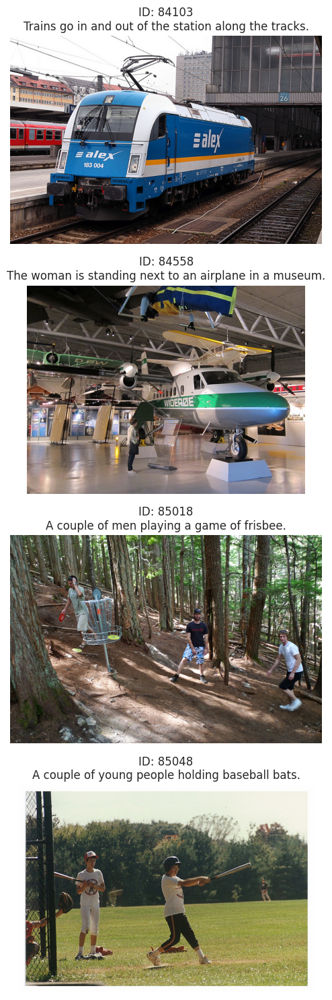

In [ ]:
import os
import json
import matplotlib.pyplot as plt
from PIL import Image

# Define the directories containing your images and captions
image_directory = '/content/drive/MyDrive/dataset/Images'
caption_path = '/content/drive/MyDrive/dataset/captions.json'

# Load the captions from the JSON file
with open(caption_path, 'r') as f:
    captions_data = json.load(f)

# Check if the captions_data is a list, if not convert it to a list
if isinstance(captions_data, dict):
    captions_data = list(captions_data.values())

# Specify the image IDs you want to display (replace with valid IDs)
image_ids_to_display = [84103, 84558, 85018, 85048]  # Example IDs

# Set up the figure and axes for display
fig, axes = plt.subplots(nrows=len(image_ids_to_display), ncols=1, figsize=(10, 15))

# Loop through the specified image IDs and display the corresponding images
for ax, image_id in zip(axes, image_ids_to_display):
    # Find the corresponding caption
    caption = next((item['caption'] for item in captions_data if item['image_id'] == image_id), "Caption not found")

    # Construct the image filename according to the specified format
    image_filename = f"COCO_train2014_{image_id:012d}.jpg"  # Format ID to 12 digits
    image_path = os.path.join(image_directory, image_filename)

    # Load and display the image
    try:
        img = Image.open(image_path)
        ax.imshow(img)
        ax.set_title(f"ID: {image_id}\n{caption}", fontsize=12)
        ax.axis('off')  # Hide axes
    except FileNotFoundError:
        ax.set_title(f"ID: {image_id}\nImage not found", fontsize=12)
        ax.axis('off')  # Hide axes

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
data=pd.read_csv('/content/drive/MyDrive/dataset/captions.json')
data.head()
df = df.drop_duplicates()

In [ ]:
# 2. Check for Missing Values
missing_summary = df.isnull().sum()
print("Missing values in each column:\n", missing_summary)

# Optionally, handle missing values (drop or fill)
df = df.dropna()  # Drop rows with missing values

Missing values in each column:
 image_id    0
id          0
caption     0
dtype: int64


In [ ]:
# 3. Standardize data formats (example: converting captions to lowercase)
df['caption'] = df['caption'].str.lower()
df.head()

,image_id,id,caption
0,299675,328,a white square kitchen with tile floor that ne...
1,513461,572,"a surfer, a woman, and a child walk on the beach."
2,18691,653,a few people sit on a dim transportation system.
3,285579,668,"a person, protected from the rain by their umb..."
4,266366,674,the bathroom with a toilet has an interesting ...


In [ ]:
# 4. Review data quality (e.g., check for empty captions)
df = df[df['caption'].str.strip() != '']
data.head()

,image_id,id,caption
0,299675,328,A white square kitchen with tile floor that ne...
1,513461,572,"A surfer, a woman, and a child walk on the beach."
2,18691,653,A few people sit on a dim transportation system.
3,285579,668,"A person, protected from the rain by their umb..."
4,266366,674,The bathroom with a toilet has an interesting ...


In [ ]:
import pandas as pd

# Load the data (use the full path to your CSV file)
df = pd.read_csv('/content/drive/MyDrive/dataset/captions.json')  # Replace with the actual path to your input file

# Data Cleaning Steps
df = (df.drop_duplicates()
        .dropna()
        .assign(caption=lambda x: x['caption'].str.lower().str.strip())
        .query("caption != ''"))

# Save the cleaned DataFrame to a new CSV
df.to_csv("cleaned_output.csv", index=False)  # Output file in the current directory

print("Data cleaning complete. Cleaned data saved to: cleaned_output.csv")


In [53]:
import cv2
import numpy as np

# File paths
input_image_path = "/content/COCO_train2014_000000000009.jpg"  # Path to your input image
output_image_path = "path/to/your/preprocessed_image.jpg"  # Path to save the preprocessed image

# Preprocessing parameters
target_size = (224, 224)  # Resize to 224x224

# Load, preprocess, and save the image
def preprocess_image(image_path, output_path):
    img = cv2.imread(image_path)
    if img is None:
        print("Error loading image.")
        return

    # Resize and normalize
    img = cv2.resize(img, target_size) / 255.0
    img_uint8 = (img * 255).astype(np.uint8)  # Convert back to uint8 for saving

    # Save the preprocessed image
    cv2.imwrite(output_path, img_uint8)
    print(f"Preprocessed image saved to: {output_path}")

# Run preprocessing
preprocess_image(input_image_path, output_image_path)



Preprocessed image saved to: path/to/your/preprocessed_image.jpg


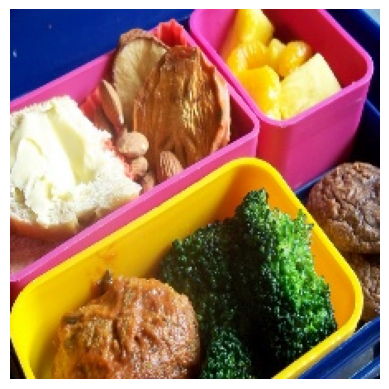

In [55]:
import cv2
import matplotlib.pyplot as plt

# Load and display image
img = cv2.imread("path/to/your/preprocessed_image.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for matplotlib
plt.imshow(img_rgb)
plt.axis("off")  # Hide axes
plt.show()


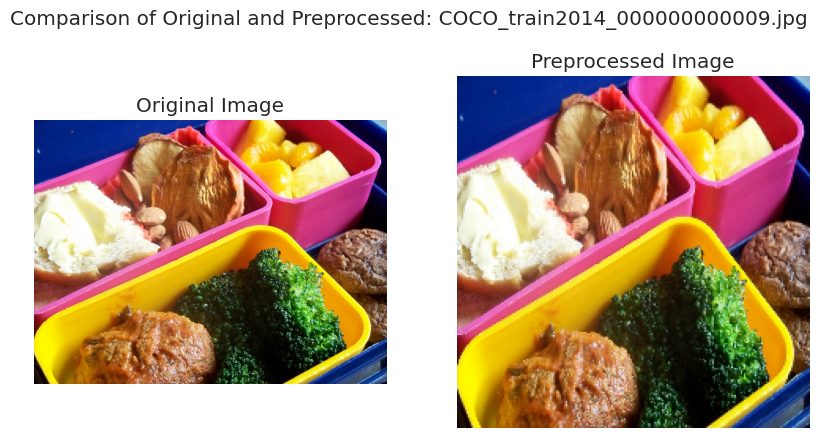

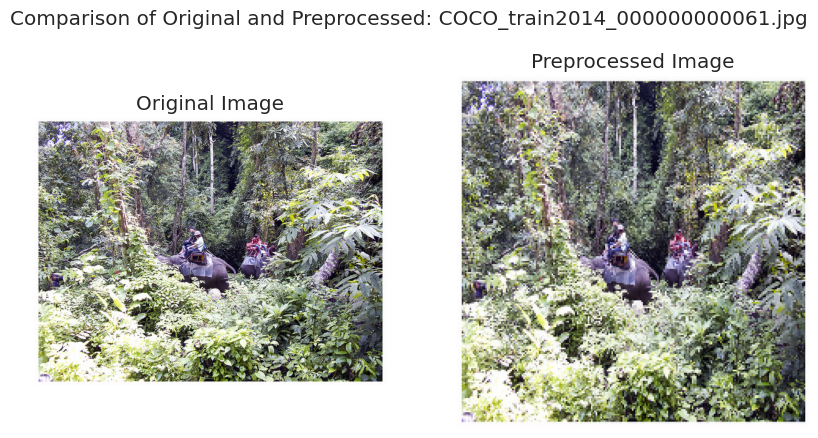

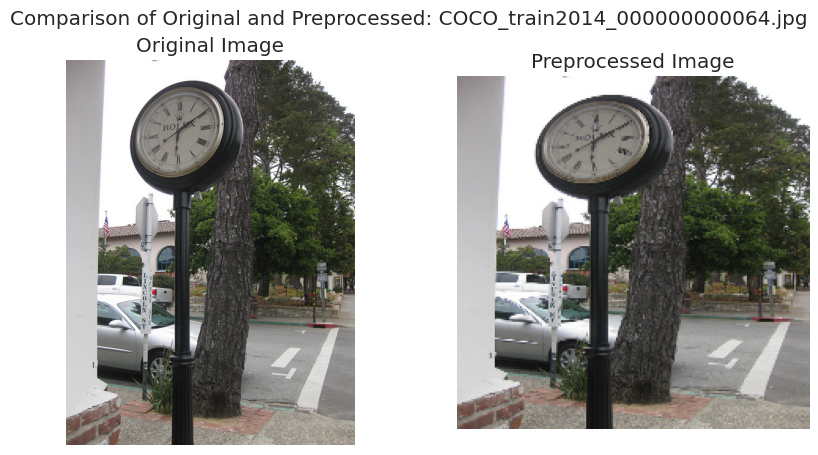

Error loading image: /content/COCO_train2014_000000000065.jpg


In [77]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List of image paths (use actual paths for your images)
image_paths = [
  "/content/COCO_train2014_000000000009.jpg",
    "/content/COCO_train2014_000000000061.jpg",
    "/content/COCO_train2014_000000000064.jpg",
    "/content/COCO_train2014_000000000065.jpg",

]

# Preprocessing parameters
target_size = (224, 224)  # Resize to 224x224

def preprocess_image(image_path):
    """Loads, resizes, and normalizes an image."""
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading image: {image_path}")
        return None

    # Resize and normalize
    img = cv2.resize(img, target_size) / 255.0
    return (img * 255).astype(np.uint8)  # Convert back for displaying

# Process and display each image
for image_path in image_paths:
    original_image = cv2.imread(image_path)
    preprocessed_image = preprocess_image(image_path)

    if preprocessed_image is not None:
        # Display both images side by side
        plt.figure(figsize=(10, 5))

        # Show original image
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.axis("off")  # Hide axes

        # Show preprocessed image
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(preprocessed_image, cv2.COLOR_BGR2RGB))
        plt.title("Preprocessed Image")
        plt.axis("off")  # Hide axes

        plt.suptitle(f"Comparison of Original and Preprocessed: {image_path.split('/')[-1]}")
        plt.show()
